In [4]:
import torch
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import shutil
import copy
import glob
import tqdm
import random
import pickle
from collections import defaultdict
import requests
import PIL


print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

%matplotlib inline
%load_ext autoreload
%autoreload 2

PyTorch Version:  1.7.1+cpu
Torchvision Version:  0.8.2+cpu
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
concept_dict = pickle.load(open('sq_layer_3_concepts_170.pkl', 'rb'))

# Set up the Model

In [6]:
model_name = "squeezenet"
batch_size = 8
num_epochs = 5
feature_extract = True
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

def initialize_model(use_pretrained=True):
    model_ft = models.squeezenet1_0(pretrained=use_pretrained)
    set_parameter_requires_grad(model_ft, feature_extract)
    input_size = 224
    return model_ft, input_size

model_ft, input_size = initialize_model()

# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [7]:
class SqueezenetBottom(nn.Module):
    def __init__(self, original_model):
        super(SqueezenetBottom, self).__init__()
        self.features = nn.Sequential(*list(list(original_model.children())[0].children())[:15], nn.Flatten())

    def forward(self, x):
        x = self.features(x)
        return x

class SqueezenetTop(nn.Module):
    def __init__(self, original_model):
        super(SqueezenetTop, self).__init__()
        self.features = nn.Sequential(*list(original_model.children())[1])

    def forward(self, x):
        x = x.view((-1, 512, 13, 13))
        x = self.features(x)
        x = x.view((-1, 1000))
        x = nn.Softmax(dim=-1)(x)
        return x

def get_model_parts(model):    
    model_bottom = SqueezenetBottom(model)
    model_top = SqueezenetTop(model)
    return model_bottom, model_top

model_bottom, model_top = get_model_parts(model_ft)
model_bottom.eval()
model_top.eval();

# Evaluation Methods

In [8]:
concept_dict = pickle.load(open('sq_concepts_170.pkl', 'rb'))

In [38]:
response = requests.get("https://git.io/JJkYN")
class_labels = response.text.split("\n")

In [62]:
class_labels

['tench',
 'goldfish',
 'great white shark',
 'tiger shark',
 'hammerhead',
 'electric ray',
 'stingray',
 'cock',
 'hen',
 'ostrich',
 'brambling',
 'goldfinch',
 'house finch',
 'junco',
 'indigo bunting',
 'robin',
 'bulbul',
 'jay',
 'magpie',
 'chickadee',
 'water ouzel',
 'kite',
 'bald eagle',
 'vulture',
 'great grey owl',
 'European fire salamander',
 'common newt',
 'eft',
 'spotted salamander',
 'axolotl',
 'bullfrog',
 'tree frog',
 'tailed frog',
 'loggerhead',
 'leatherback turtle',
 'mud turtle',
 'terrapin',
 'box turtle',
 'banded gecko',
 'common iguana',
 'American chameleon',
 'whiptail',
 'agama',
 'frilled lizard',
 'alligator lizard',
 'Gila monster',
 'green lizard',
 'African chameleon',
 'Komodo dragon',
 'African crocodile',
 'American alligator',
 'triceratops',
 'thunder snake',
 'ringneck snake',
 'hognose snake',
 'green snake',
 'king snake',
 'garter snake',
 'water snake',
 'vine snake',
 'night snake',
 'boa constrictor',
 'rock python',
 'Indian cobr

In [39]:
def get_concept_scores(tensor, label, normalize=True):
    correct_idx = class_labels.index(label)
    concept_scores = {}
    embedding = model_bottom(tensor)
    original_preds = model_top(embedding).detach().numpy().squeeze()
    
    multiplier = 100000
    
    for key in concept_dict:
        coef, _, _ = concept_dict[key]
        plus = torch.from_numpy(embedding.detach().numpy() + multiplier*coef).float()
        plus_preds = model_top(plus)
        plus_diff = plus_preds.squeeze()[correct_idx] - original_preds.squeeze()[correct_idx]
        concept_scores[key] = float(plus_diff)
        
    concept_scores_list = sorted(concept_scores, key=concept_scores.get, reverse=True)  
    if normalize:
        nf = np.max(np.abs(list(concept_scores.values())))
        for c in concept_scores:
            concept_scores[c] = concept_scores[c] / nf
    return original_preds[correct_idx], concept_scores, concept_scores_list    

In [80]:
img = PIL.Image.open("C:\\Users\\islam\\downloads\\strawberry.jpg").convert("RGB")
img_ = PIL.Image.open("C:\\Users\\islam\\downloads\\strawberry.jpg").convert("L").convert("RGB")

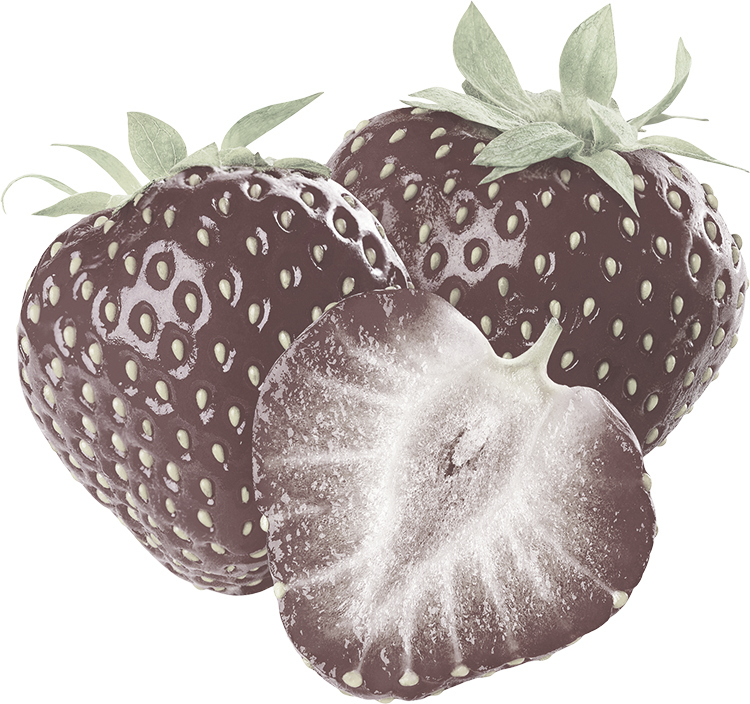

pred 0.025901852 ces 1.0


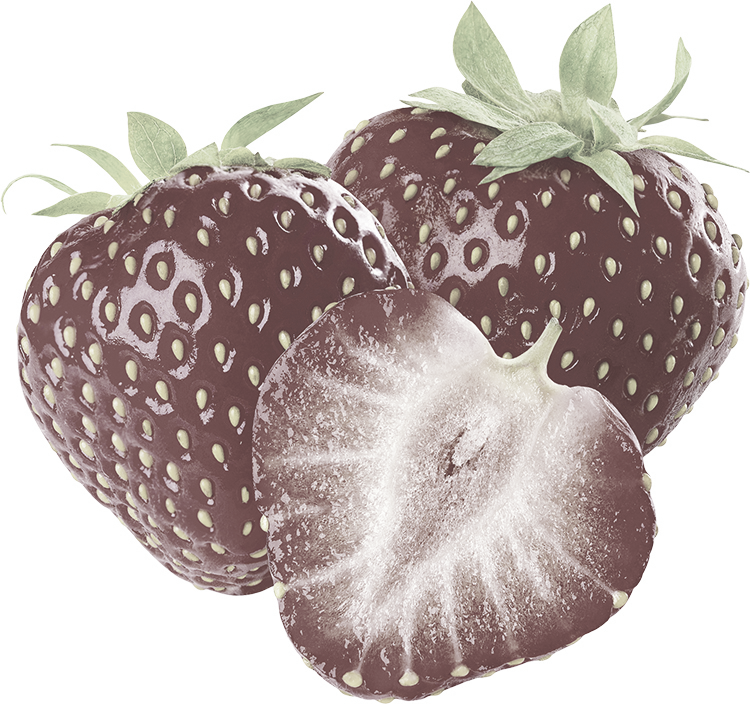

pred 0.042625606 ces 1.0


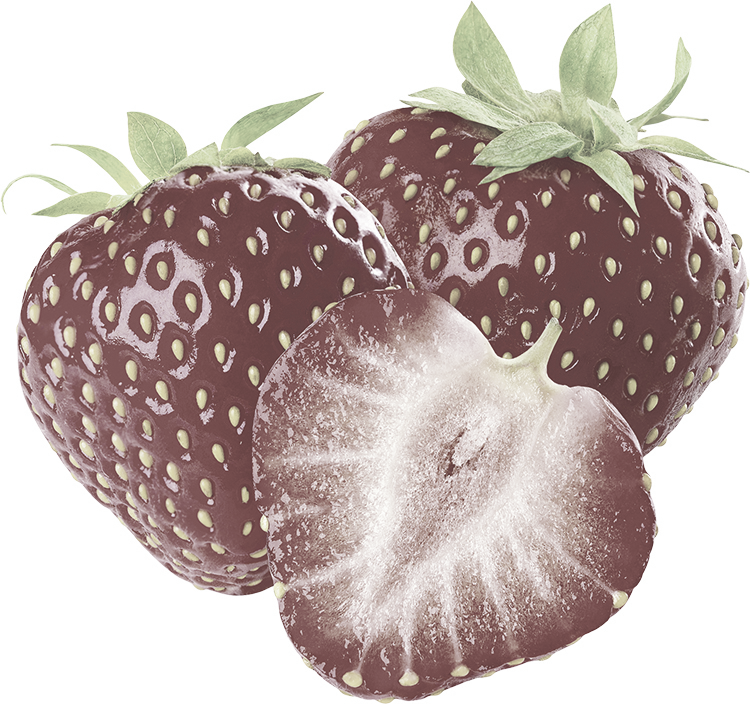

pred 0.08153485 ces 1.0


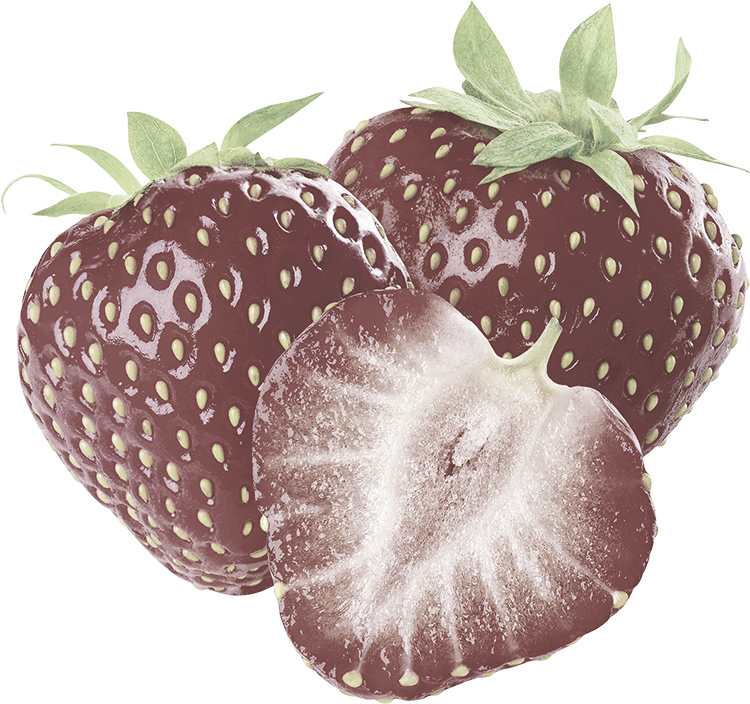

pred 0.13696331 ces 1.0


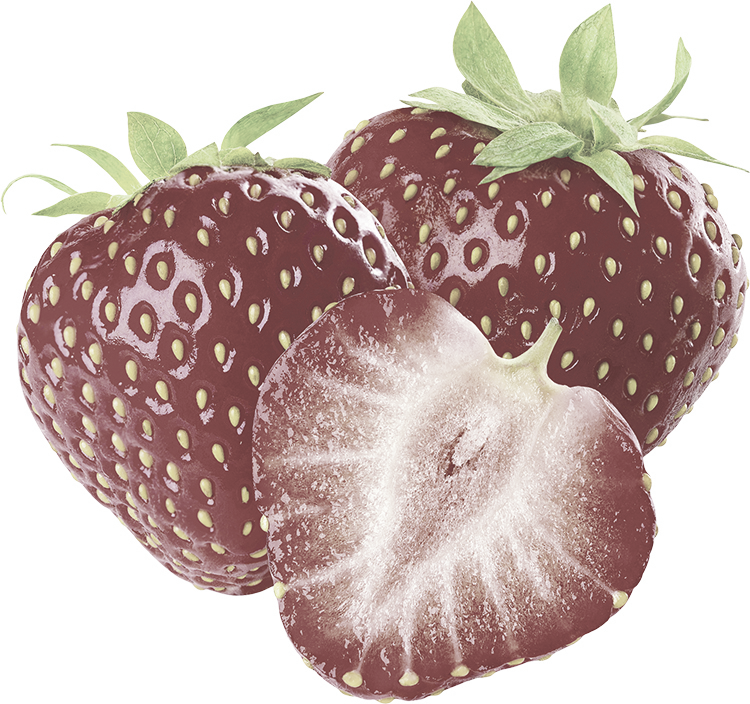

pred 0.26738578 ces 1.0


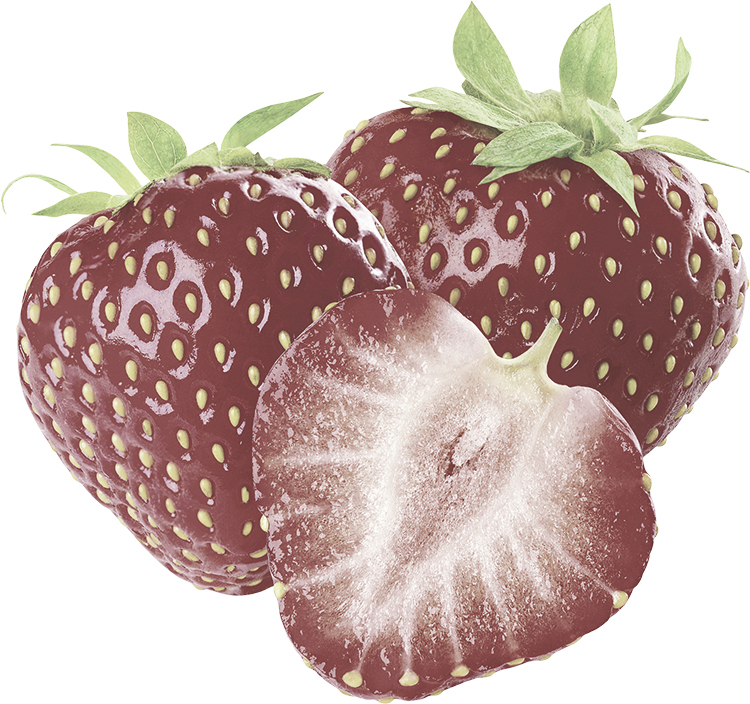

pred 0.46151805 ces 1.0


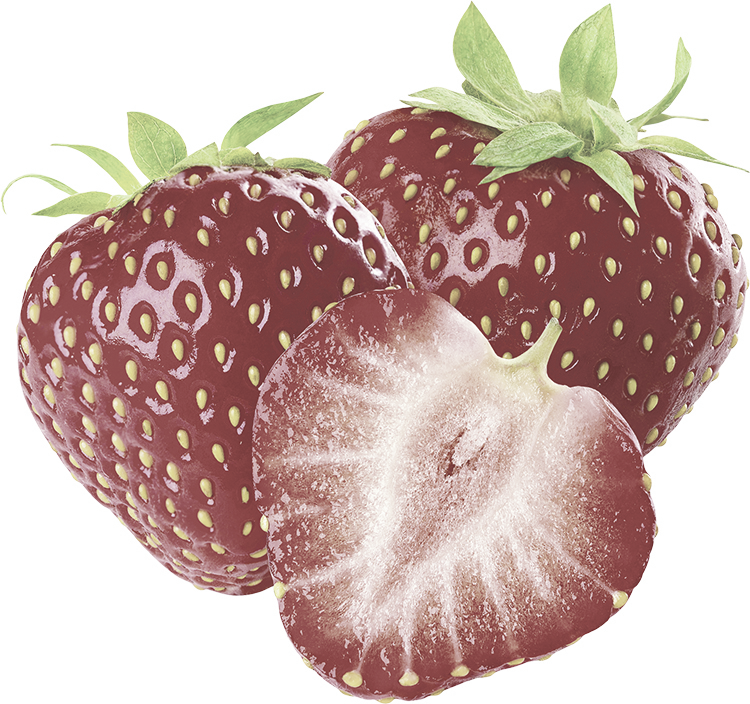

pred 0.6610666 ces 0.5157617499845034


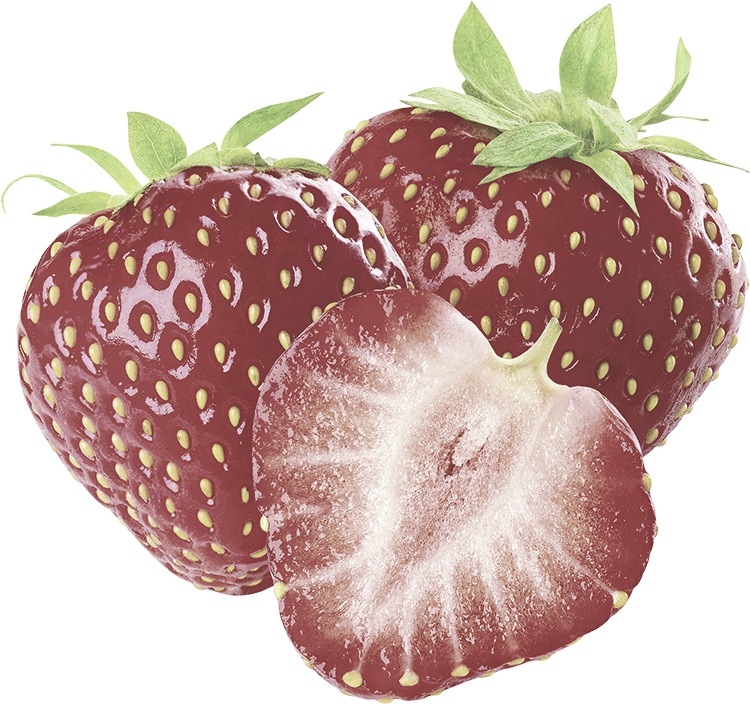

pred 0.8157255 ces 0.25614168431175205


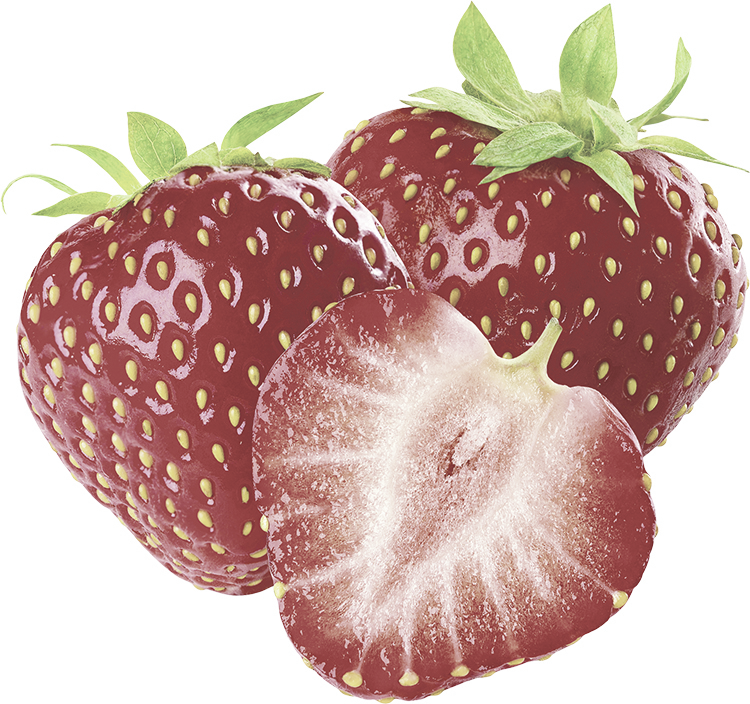

pred 0.9015059 ces 0.14963071854470622


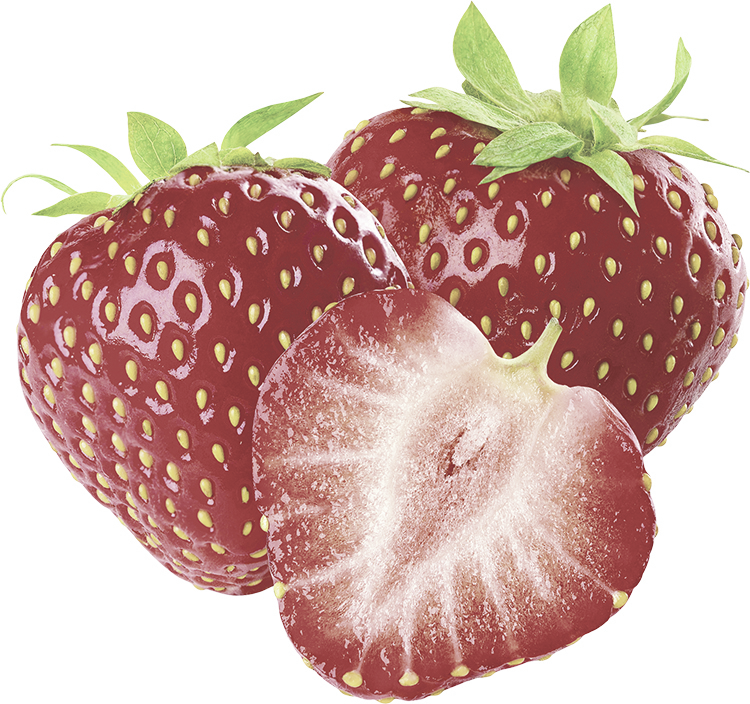

pred 0.94254553 ces 0.1068405507470793


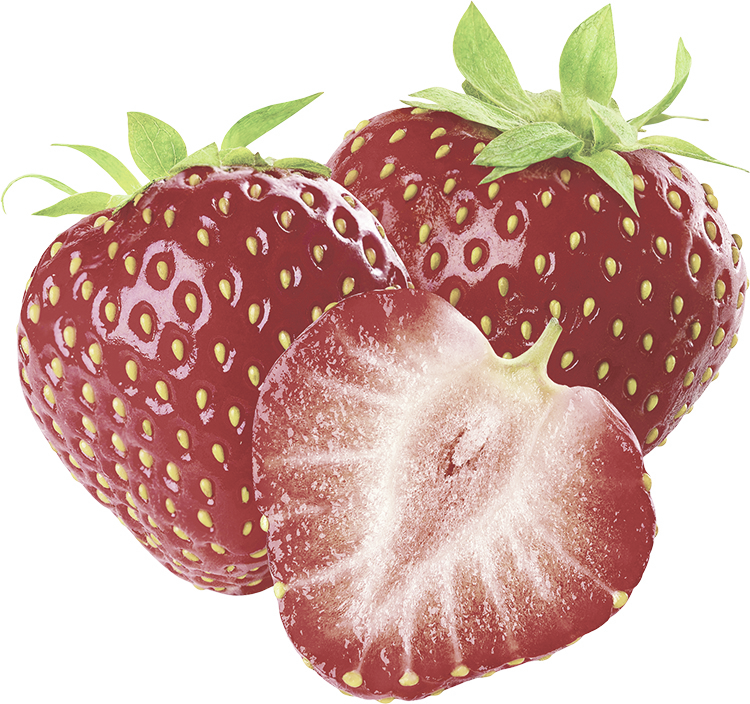

pred 0.9652022 ces 0.08651860069239928


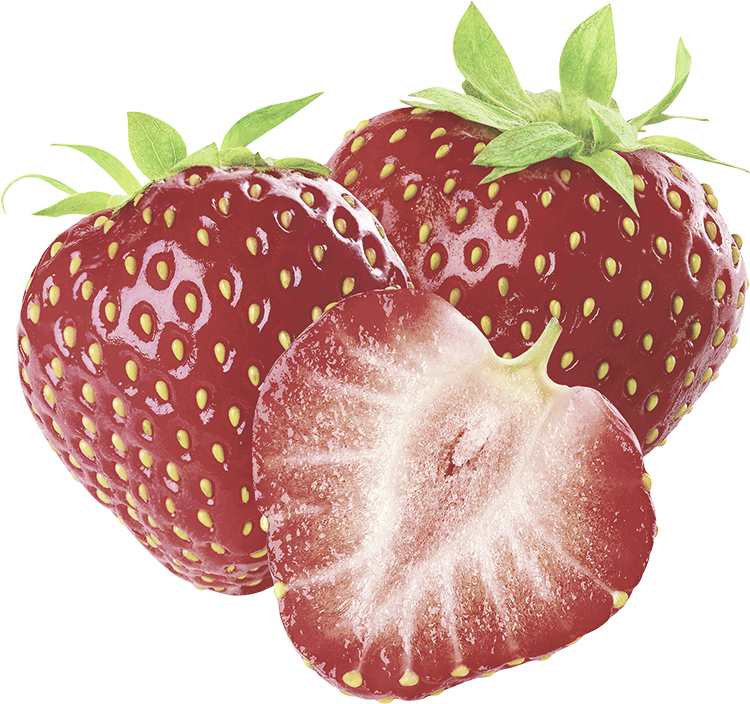

pred 0.97944754 ces 0.07633816978312782


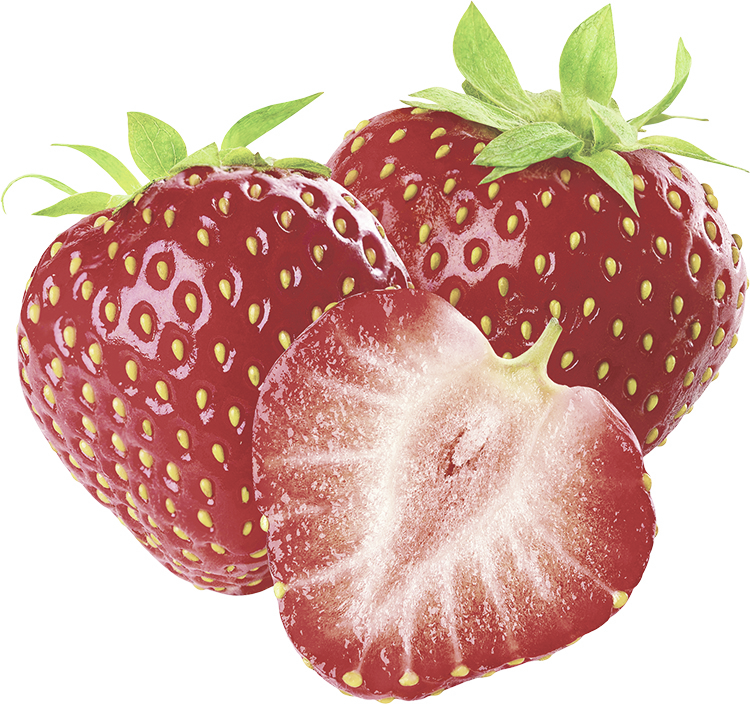

pred 0.9859497 ces 0.07483753999595195


In [83]:
preds = []
ces = []
images = []

alphas = np.concatenate([np.linspace(0.12, 0.5, 13)])

for alpha in alphas:
    average_img = PIL.Image.fromarray(np.array(alpha*np.array(img) + (1-alpha)*np.array(img_), dtype=np.uint8))
    display(average_img)
    images.append(average_img)
    tensor = data_transforms(average_img).unsqueeze(0)
    pred, concept_scores, concept_scores_list = get_concept_scores(tensor, "strawberry")
    preds.append(pred)
    ces.append(concept_scores['redness'])
    print('pred', pred, 'ces', concept_scores['redness'])    

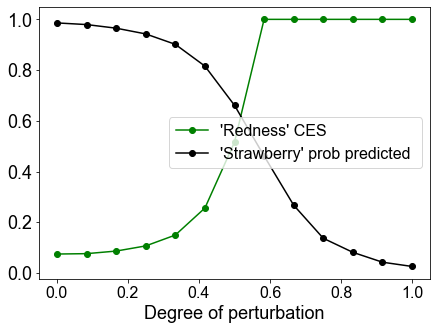

In [84]:
plt.figure(figsize=[7, 5])
plt.plot(np.linspace(0,1,len(alphas)), np.array(ces)[::-1], marker='o', color='green', label='\'Redness\' CES')
plt.plot(np.linspace(0,1,len(alphas)), preds[::-1], marker='o', color='black', label='\'Strawberry\' prob predicted ')
plt.yticks(fontname='Arial', fontsize=18)
plt.xticks(fontname='Arial', fontsize=16)
# plt.ylabelfontname='Arial', fontsize=18)
plt.xlabel('Degree of perturbation', fontname='Arial', fontsize=18)
plt.legend(prop={'family':'Arial', 'size':16}, loc="center right")

# 50 Images

In [57]:
from google_images_download import google_images_download   #importing the library

response = google_images_download.googleimagesdownload()   #class instantiation

arguments = {"keywords":"strawberry","limit":100,"print_urls":True, "size":"medium"}   #creating list of arguments
paths = response.download(arguments)   #passing the arguments to the function
print(paths)


Item no.: 1 --> Item name = strawberry
Evaluating...
Starting Download...
Image URL: https://i0.wp.com/images-prod.healthline.com/hlcmsresource/images/AN_images/strawberries-1296x728-feature.jpg?w=1155&h=1528
Completed Image ====> 1.strawberries-1296x728-feature.jpg
Image URL: https://www.thermofisher.com/blog/food/wp-content/uploads/sites/5/2015/08/single_strawberry__isolated_on_a_white_background.jpg
Completed Image ====> 2.single_strawberry__isolated_on_a_white_background.jpg.webp
Image URL: https://www.gardentech.com/-/media/Images/GardenTech-NA/US/blog/How-to-Grow-Your-Own-Tasty-Strawberries/Strawberries-Header-OG.jpg
Completed Image ====> 3.strawberries-header-og.jpg
Image URL: https://images.immediate.co.uk/production/volatile/sites/30/2013/06/Strawberries-in-a-bowl-e53b458-scaled.jpg?quality=45&resize=768,574
Completed Image ====> 4.strawberries-in-a-bowl-e53b458-scaled.jpg
Image URL: https://static.libertyprim.com/files/familles/fraise-large.jpg?1569271765
Completed Image ===

Completed Image ====> 43.delish-chocolate-covered-strawberry-shooters-still001-1529094261.jpg
Image URL: https://live.staticflickr.com/65535/50925844971_c451d2f5f3_z.jpg
Completed Image ====> 44.50925844971_c451d2f5f3_z.jpg
Image URL: https://cdn.shopify.com/s/files/1/0156/0137/products/Wild_Strawberry_plant_1200x960_a2f198b5-c952-4e69-98ff-f01210e0e219_grande.jpg?v=1596146204
Completed Image ====> 45.wild_strawberry_plant_1200x960_a2f198b5-c952-4e69-98ff-f01210e0e219_grande.jpg
Image URL: https://cdn.technologynetworks.com/tn/images/thumbs/jpeg/640_360/strawberry-keepsake-could-last-for-longer-328320.jpg
Completed Image ====> 46.strawberry-keepsake-could-last-for-longer-328320.jpg
Image URL: https://d2cbg94ubxgsnp.cloudfront.net/Pictures/1024x536/7/5/6/108756_strawberry.jpg
Completed Image ====> 47.108756_strawberry.jpg
Image URL: https://blog.aghires.com/hubfs/Ag-Fact-Friday_Strawberries.png
Completed Image ====> 48.ag-fact-friday_strawberries.png
Image URL: https://www.greenhousegro

Completed Image ====> 88.hort-americas-growing-hydroponic-strawberries.jpg
Image URL: https://post.healthline.com/wp-content/uploads/2020/06/female-holding-strawberry-facebook.20190724214812501-1200x628.jpg
Completed Image ====> 89.female-holding-strawberry-facebook.20190724214812501-1200x628.jpg
Image URL: http://www.gimmesomeoven.com/wp-content/uploads/2014/04/Strawberry-Banana-Smoothie-4.jpg
Completed Image ====> 90.strawberry-banana-smoothie-4.jpg
Image URL: https://weelicious.com/imager/weelicious_com/wp-content/uploads/2011/06/Strawberries-Cream_1b74faffbe944b0675f0e20473d3ad34.jpg
Completed Image ====> 91.strawberries-cream_1b74faffbe944b0675f0e20473d3ad34.jpg
Image URL: https://i0.wp.com/www.europeanpublicaffairs.eu/wp-content/uploads/2013/11/strawberry2.jpg?fit=730%2C503
Completed Image ====> 92.strawberry2.jpg
Image URL: https://www.gardeningknowhow.com/wp-content/uploads/2017/06/zone-9-strawberry-400x300.jpg
Completed Image ====> 93.zone-9-strawberry-400x300.jpg
Image URL: h

In [206]:
len(ces_scores)

20

array([0.08143903, 0.0994096 , 0.11797524, 0.1378712 , 0.16091861,
       0.17871474, 0.18488706, 0.1818579 , 0.16777004, 0.15073263])

In [250]:
ces_scores_norm = [(np.array(c)-np.array(c).min())/(np.array(c).max()-np.array(c).min()) for c in ces_scores[:25]]

Text(0.5, 0, 'Degree of perturbation')

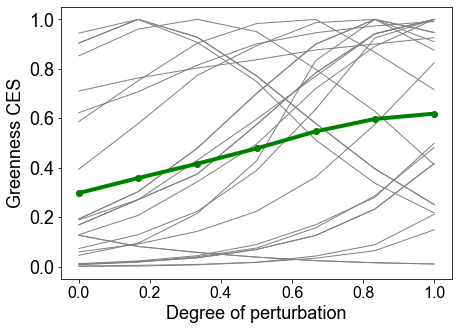

In [263]:
plt.figure(figsize=[7, 5])

plt.plot(np.linspace(0, 1, 7), np.fliplr(np.array(ces_scores_norm)[:,3:-3]).T, color='gray', lw=1)
plt.plot(np.linspace(0, 1, 7), np.mean(np.fliplr(np.array(ces_scores_norm)[:,3:-3]).T, axis=1), color='green', lw=4, marker='o')

plt.yticks(fontname='Arial', fontsize=18)
plt.xticks(fontname='Arial', fontsize=16)
plt.ylabel('Greenness CES', fontname='Arial', fontsize=18)
plt.xlabel('Degree of perturbation', fontname='Arial', fontsize=18)

In [245]:
np.save('ces_scores_20', ces_scores)

In [246]:
path = 'downloads\\granny smith apple'
# ces_scores = []

for i in tqdm.tqdm(os.listdir(path)[:20]):
    image_path = os.path.join(path, i)    
    
    img = PIL.Image.open(image_path).convert("RGB")
    img_ = PIL.Image.open(image_path).convert("L").convert("RGB")    
    
    alphas = np.concatenate([np.linspace(0.12, 0.3, 10), np.linspace(0.3, 0.5, 3)])
    ces = []
    
    for alpha in alphas:
        average_img = PIL.Image.fromarray(np.array(alpha*np.array(img) + (1-alpha)*np.array(img_), dtype=np.uint8))
        tensor = data_transforms(average_img).unsqueeze(0)
        pred, concept_scores, concept_scores_list = get_concept_scores(tensor, "Granny Smith")
        ces.append(concept_scores['greenness'])
        
    ces_scores.append(ces)

  0%|          | 0/20 [00:00<?, ?it/s]c:\users\islam\appdata\local\programs\python\python39\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
 50%|█████     | 10/20 [03:29<03:29, 20.96s/it]


KeyboardInterrupt: 